In [ ]:
import pandas as pd 
import numpy as np 
import matplotlib.pyplot as plt
plt.style.use("seaborn")
from mpl_toolkits.mplot3d import Axes3D

from sklearn.cluster import KMeans
from sklearn.preprocessing import MinMaxScaler

In [ ]:
!pip install spotipy 

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
!pip install torchviz

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
!pip install --upgrade pandas-profiling

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
!pip install markupsafe==2.0.1

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
# libraries
import json
import pandas as pd
import spotipy
import requests
from spotipy.oauth2 import SpotifyClientCredentials
from collections import OrderedDict
from tqdm import tqdm
import plotly.express as px
import librosa
import librosa.display
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
from pathlib import Path
import matplotlib.pyplot as plt
import IPython
import IPython.display
import PIL
import os
import pickle
import random
import torch
import torch.nn as nn
import torch.nn.functional as F
from fastprogress import master_bar, progress_bar
from torch.optim import Adam
from torch.optim.lr_scheduler import CosineAnnealingLR
from torch.utils.data import Dataset, DataLoader
from torchvision.transforms import transforms
from psutil import cpu_count
from sklearn.model_selection import train_test_split
import time
from collections import Counter, defaultdict
from functools import partial
from PIL import Image
from sklearn.manifold import TSNE

In [ ]:
# Pandas configuration for extending the number of rows and columns to visualize, if not limit set parameter to None or -1
pd.set_option('display.max_rows', 100)
pd.set_option('display.max_columns', 100)

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
df = pd.read_excel('/content/drive/MyDrive/Ciencia de Datos/Spotify/Data_Taller_1.xlsx')
print(df)

              artist                                    song  duration_ms  \
0     Britney Spears                  Oops!...I Did It Again     211160.0   
1          blink-182                    All The Small Things     167066.0   
2         Faith Hill                                 Breathe     250546.0   
3           Bon Jovi                            It's My Life     224493.0   
4             *NSYNC                             Bye Bye Bye     200560.0   
...              ...                                     ...          ...   
1995  Jonas Brothers                                  Sucker     181026.0   
1996    Taylor Swift                            Cruel Summer     178426.0   
1997    Blanco Brown                              The Git Up     200593.0   
1998       Sam Smith  Dancing With A Stranger (with Normani)     171029.0   
1999     Post Malone                                 Circles     215280.0   

      explicit    year  popularity  danceability  energy  key  loudness  mo

In [ ]:
df=df.dropna()

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1255 entries, 0 to 1264
Data columns (total 19 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   artist            1255 non-null   object 
 1   song              1255 non-null   object 
 2   duration_ms       1255 non-null   float64
 3   explicit          1255 non-null   float64
 4   year              1255 non-null   float64
 5   popularity        1255 non-null   float64
 6   danceability      1255 non-null   float64
 7   energy            1255 non-null   float64
 8   key               1255 non-null   float64
 9   loudness          1255 non-null   float64
 10  mode              1255 non-null   float64
 11  speechiness       1255 non-null   float64
 12  acousticness      1255 non-null   float64
 13  instrumentalness  1255 non-null   object 
 14  liveness          1255 non-null   float64
 15  valence           1255 non-null   float64
 16  tempo             1255 non-null   float64


In [ ]:
df.head(10)

,artist,song,duration_ms,explicit,year,popularity,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,genre,count
0,Britney Spears,Oops!...I Did It Again,211160.0,0.0,2000.0,77.0,0.751,0.834,1.0,-5.444,0.0,0.0437,0.30000,0.000018,0.3550,0.894,95.053,pop,1.0
1,blink-182,All The Small Things,167066.0,0.0,1999.0,79.0,0.434,0.897,0.0,-4.918,1.0,0.0488,0.01030,0.0,0.6120,0.684,148.726,"rock, pop",1.0
2,Faith Hill,Breathe,250546.0,0.0,1999.0,66.0,0.529,0.496,7.0,-9.007,1.0,0.0290,0.17300,0.0,0.2510,0.278,136.859,"pop, country",1.0
3,Bon Jovi,It's My Life,224493.0,0.0,2000.0,78.0,0.551,0.913,0.0,-4.063,0.0,0.0466,0.02630,0.000013,0.3470,0.544,119.992,"rock, metal",1.0
5,Sisqo,Thong Song,253733.0,1.0,1999.0,69.0,0.706,0.888,2.0,-6.959,1.0,0.0654,0.11900,0.000096,0.0700,0.714,121.549,"hip hop, pop, R&B",1.0
6,Eminem,The Real Slim Shady,284200.0,1.0,2000.0,86.0,0.949,0.661,5.0,-4.244,0.0,0.0572,0.03020,0.0,0.0454,0.760,104.504,hip hop,1.0
7,Robbie Williams,Rock DJ,258560.0,0.0,2000.0,68.0,0.708,0.772,7.0,-4.264,1.0,0.0322,0.02670,0.0,0.4670,0.861,103.035,"pop, rock",1.0
8,Destiny's Child,Say My Name,271333.0,0.0,1999.0,75.0,0.713,0.678,5.0,-3.525,0.0,0.1020,0.27300,0.0,0.1490,0.734,138.009,"pop, R&B",1.0
9,Modjo,Lady - Hear Me Tonight,307153.0,0.0,2001.0,77.0,0.720,0.808,6.0,-5.627,1.0,0.0379,0.00793,0.0293,0.0634,0.869,126.041,Dance/Electronic,1.0
10,Gigi D'Agostino,L'Amour Toujours,238759.0,0.0,2011.0,1.0,0.617,0.728,7.0,-7.932,1.0,0.0292,0.03280,0.0482,0.3600,0.808,139.066,pop,1.0


In [ ]:
df.isnull().sum()

artist              0
song                0
duration_ms         0
explicit            0
year                0
popularity          0
danceability        0
energy              0
key                 0
loudness            0
mode                0
speechiness         0
acousticness        0
instrumentalness    0
liveness            0
valence             0
tempo               0
genre               0
count               0
dtype: int64

Descriptive statistics of Spotify 


Punto 1 (5 pts)
Describa el conjunto de datos, tipos de variables y destaque cualquier problema de calidad
de datos y procesos de limpieza que deba implementar.

In [ ]:
df.describe()

,duration_ms,explicit,year,popularity,danceability,energy,key,loudness,mode,speechiness,acousticness,liveness,valence,tempo,count
count,1255.000000,1255.000000,1255.000000,1255.000000,1255.000000,1255.000000,1255.000000,1255.000000,1255.000000,1255.000000,1255.000000,1255.000000,1255.000000,1255.000000,1255.0
mean,236190.709960,0.253386,2005.917928,59.850996,0.661935,0.738948,5.376096,-5.424407,0.552988,0.104875,0.117934,0.187568,0.583161,119.535191,1.0
std,39007.213333,0.435124,4.057260,17.622823,0.145381,0.151492,3.610467,1.912238,0.497383,0.098473,0.161204,0.148490,0.218492,27.187157,0.0
min,127920.000000,0.000000,1998.000000,0.000000,0.129000,0.058100,0.000000,-17.217000,0.000000,0.023900,0.000019,0.023400,0.040600,60.019000,1.0
25%,210166.000000,0.000000,2003.000000,56.000000,0.570000,0.647000,2.000000,-6.392500,0.000000,0.038150,0.010750,0.085500,0.425500,97.915500,1.0
50%,230200.000000,0.000000,2006.000000,63.000000,0.673000,0.752000,5.000000,-5.158000,1.000000,0.059800,0.050500,0.129000,0.594000,120.011000,1.0
75%,256386.000000,1.000000,2009.000000,70.000000,0.762000,0.860500,8.000000,-4.144500,1.000000,0.134500,0.163500,0.254000,0.761500,134.728500,1.0
max,452906.000000,1.000000,2020.000000,87.000000,0.975000,0.999000,11.000000,-0.276000,1.000000,0.576000,0.976000,0.853000,0.973000,210.851000,1.0


In [ ]:
df.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
duration_ms,1255.0,236190.709960,39007.213333,127920.000000,210166.00000,230200.0000,256386.0000,452906.000
explicit,1255.0,0.253386,0.435124,0.000000,0.00000,0.0000,1.0000,1.000
year,1255.0,2005.917928,4.057260,1998.000000,2003.00000,2006.0000,2009.0000,2020.000
popularity,1255.0,59.850996,17.622823,0.000000,56.00000,63.0000,70.0000,87.000
danceability,1255.0,0.661935,0.145381,0.129000,0.57000,0.6730,0.7620,0.975
energy,1255.0,0.738948,0.151492,0.058100,0.64700,0.7520,0.8605,0.999
key,1255.0,5.376096,3.610467,0.000000,2.00000,5.0000,8.0000,11.000
loudness,1255.0,-5.424407,1.912238,-17.217000,-6.39250,-5.1580,-4.1445,-0.276
mode,1255.0,0.552988,0.497383,0.000000,0.00000,1.0000,1.0000,1.000
speechiness,1255.0,0.104875,0.098473,0.023900,0.03815,0.0598,0.1345,0.576


In [ ]:
from pandas_profiling import ProfileReport

In [ ]:
profile = ProfileReport(df, title="EDA Spotify")
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
df.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
duration_ms,1255.0,236190.709960,39007.213333,127920.000000,210166.00000,230200.0000,256386.0000,452906.000
explicit,1255.0,0.253386,0.435124,0.000000,0.00000,0.0000,1.0000,1.000
year,1255.0,2005.917928,4.057260,1998.000000,2003.00000,2006.0000,2009.0000,2020.000
popularity,1255.0,59.850996,17.622823,0.000000,56.00000,63.0000,70.0000,87.000
danceability,1255.0,0.661935,0.145381,0.129000,0.57000,0.6730,0.7620,0.975
energy,1255.0,0.738948,0.151492,0.058100,0.64700,0.7520,0.8605,0.999
key,1255.0,5.376096,3.610467,0.000000,2.00000,5.0000,8.0000,11.000
loudness,1255.0,-5.424407,1.912238,-17.217000,-6.39250,-5.1580,-4.1445,-0.276
mode,1255.0,0.552988,0.497383,0.000000,0.00000,1.0000,1.0000,1.000
speechiness,1255.0,0.104875,0.098473,0.023900,0.03815,0.0598,0.1345,0.576


Punto 1 (5 pts)
¿Cuál es el top 10 de artistas más activos de los últimos 10 años?

Top 10 most popular songs on Spotify

In [ ]:
most = df.query('popularity > 80', inplace = False).sort_values('popularity', ascending = False)
most[:10]

,artist,song,duration_ms,explicit,year,popularity,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,genre,count
201,Eminem,Without Me,290320.0,1.0,2002.0,87.0,0.908,0.669,7.0,-2.827,1.0,0.0738,0.00286,0.0,0.2370,0.662,112.238,hip hop,1.0
6,Eminem,The Real Slim Shady,284200.0,1.0,2000.0,86.0,0.949,0.661,5.0,-4.244,0.0,0.0572,0.03020,0.0,0.0454,0.760,104.504,hip hop,1.0
209,Eminem,Till I Collapse,297786.0,1.0,2002.0,85.0,0.548,0.847,1.0,-3.237,1.0,0.1860,0.06220,0.0,0.0816,0.100,171.447,hip hop,1.0
1227,Bruno Mars,Locked out of Heaven,233478.0,0.0,2012.0,85.0,0.726,0.698,5.0,-4.165,1.0,0.0431,0.04900,0.0,0.3090,0.867,143.994,pop,1.0
20,Linkin Park,In the End,216880.0,0.0,2000.0,83.0,0.556,0.864,3.0,-5.870,0.0,0.0584,0.00958,0.0,0.2090,0.400,105.143,"rock, metal",1.0
102,Eminem,Stan,404106.0,1.0,2000.0,83.0,0.780,0.768,6.0,-4.325,0.0,0.2380,0.03710,0.000002,0.5180,0.507,80.063,hip hop,1.0
215,Linkin Park,In the End,216880.0,0.0,2000.0,83.0,0.556,0.864,3.0,-5.870,0.0,0.0584,0.00958,0.0,0.2090,0.400,105.143,"rock, metal",1.0
19,Dr. Dre,The Next Episode,161506.0,1.0,1999.0,82.0,0.922,0.909,10.0,-2.429,0.0,0.2700,0.02810,0.0,0.0856,0.309,95.295,hip hop,1.0
1238,Maroon 5,Payphone,231173.0,1.0,2012.0,82.0,0.743,0.752,4.0,-4.813,1.0,0.0414,0.01880,0.0,0.2870,0.545,110.015,pop,1.0
1209,JAY-Z,Ni**as In Paris,219333.0,1.0,2011.0,82.0,0.789,0.858,1.0,-5.542,1.0,0.3110,0.12700,0.0,0.3490,0.775,140.022,hip hop,1.0


Top 10 least popular songs on Spotify

In [ ]:
least = df.sort_values('popularity', ascending = True).head(10)
least

,artist,song,duration_ms,explicit,year,popularity,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,genre,count
59,Oasis,Go Let It Out,278666.0,0.0,2000.0,0.0,0.408,0.849,2.0,-5.631,1.0,0.0333,0.013600,0.000025,0.5600,0.6280,84.192,"Folk/Acoustic, rock",1.0
1167,Nicki Minaj,Super Bass,200013.0,1.0,2010.0,0.0,0.720,0.861,11.0,-4.339,1.0,0.2090,0.269000,0.000005,0.6010,0.6690,126.991,"hip hop, pop",1.0
1048,Tim Berg,Seek Bromance - Aviciiâ€™s Vocal Edit,203960.0,0.0,2010.0,0.0,0.515,0.837,11.0,-2.552,1.0,0.0401,0.086800,0.0,0.0403,0.5200,126.026,"pop, Dance/Electronic",1.0
584,T-Pain,I'm Sprung,231040.0,0.0,2005.0,0.0,0.722,0.329,0.0,-11.617,0.0,0.1080,0.088000,0.0,0.0810,0.1660,99.991,"hip hop, pop, R&B",1.0
126,Jennifer Lopez,Ain't It Funny,246160.0,0.0,2001.0,0.0,0.707,0.869,5.0,-4.525,0.0,0.0481,0.104000,0.000121,0.0813,0.6210,99.825,"hip hop, pop, R&B",1.0
637,Cascada,Everytime We Touch - Radio Edit,199120.0,0.0,2011.0,0.0,0.640,0.977,8.0,-5.369,1.0,0.0555,0.004610,0.000017,0.3710,0.4930,142.019,"hip hop, pop, Dance/Electronic",1.0
641,P!nk,Stupid Girls,197173.0,1.0,2006.0,0.0,0.683,0.886,4.0,-5.045,0.0,0.0710,0.000738,0.00188,0.0524,0.5660,100.040,pop,1.0
899,T-Pain,Can't Believe It (feat. Lil' Wayne),273826.0,0.0,2008.0,0.0,0.648,0.516,10.0,-8.869,0.0,0.0490,0.001790,0.0,0.0772,0.0756,89.828,"hip hop, pop, R&B",1.0
778,Jim Jones,We Fly High,236080.0,1.0,2006.0,0.0,0.685,0.800,1.0,-6.564,1.0,0.2980,0.084700,0.0,0.0920,0.4830,120.226,"hip hop, pop",1.0
661,Rascal Flatts,Life is a Highway,276773.0,0.0,2006.0,0.0,0.561,0.936,5.0,-5.409,1.0,0.0613,0.001850,0.0,0.1020,0.5940,103.055,country,1.0


In [ ]:
popular_artists=df.artist.value_counts().sort_values(ascending=False)[:10]
popular_artists = pd.DataFrame(popular_artists).reset_index()
popular_artists = popular_artists.rename(columns={"index":"Artist", "artist":"Count"})
popular_artists.head()

,Artist,Count
0,Rihanna,21
1,Eminem,18
2,Britney Spears,18
3,Kanye West,16
4,Black Eyed Peas,14


In [ ]:
fig = px.pie(popular_artists, values="Count", names="Artist")
fig.update_layout(title={'text': "Top 10 Artists from  Spotify Data"})
fig.show()

In [ ]:
popular_song_title=df.song.value_counts().sort_values(ascending=False)[:10]
popular_song_title = pd.DataFrame(popular_song_title).reset_index()
popular_song_title = popular_song_title.rename(columns={"index":"Songs", "song":"Count"})
popular_song_title.head()

,Songs,Count
0,It's My Life,3
1,Higher,3
2,Leave Right Now,2
3,Whatcha Say,2
4,Beautiful,2


In [ ]:
popular_song_title=df.song.value_counts().sort_values(ascending=False)[:10]
popular_song_title = pd.DataFrame(popular_song_title).reset_index()
popular_song_title = popular_song_title.rename(columns={"index":"Songs", "song":"Count"})
popular_song_title.head()

In [ ]:
fig=px.line_polar(popular_song_title,r='song',theta='Songs',line_close=True)
fig.update_traces(fill='toself')
fig.update_layout(title={'text': "Top 10 Songs from Spotify Data"})
fig.show()

In [ ]:
df_corr = df.corr()
df_corr

,duration_ms,explicit,year,popularity,danceability,energy,key,loudness,mode,speechiness,acousticness,liveness,valence,tempo,count
duration_ms,1.000000,0.184374,-0.188831,0.071954,-0.021964,-0.154052,-0.017368,-0.123051,0.010998,0.134314,0.051788,0.037099,-0.195063,-0.030332,NaN
explicit,0.184374,1.000000,-0.019379,0.056301,0.199213,-0.092094,-0.009441,-0.027874,0.033714,0.448726,-0.027370,0.039852,0.015737,-0.035234,NaN
year,-0.188831,-0.019379,1.000000,-0.070257,-0.090694,0.100413,0.008097,0.167497,-0.015033,-0.044712,-0.131294,0.068417,-0.118014,0.124065,NaN
popularity,0.071954,0.056301,-0.070257,1.000000,-0.005097,0.070442,-0.026466,0.114532,-0.039720,0.033549,-0.029995,-0.002198,0.014708,0.073181,NaN
danceability,-0.021964,0.199213,-0.090694,-0.005097,1.000000,-0.082730,0.027026,-0.008707,-0.108900,0.139131,-0.091993,-0.124787,0.483226,-0.196232,NaN
energy,-0.154052,-0.092094,0.100413,0.070442,-0.082730,1.000000,0.020440,0.615180,-0.043741,-0.023136,-0.431839,0.152806,0.278543,0.189073,NaN
key,-0.017368,-0.009441,0.008097,-0.026466,0.027026,0.020440,1.000000,0.021819,-0.146547,0.005574,-0.009828,-0.031716,0.060205,0.022969,NaN
loudness,-0.123051,-0.027874,0.167497,0.114532,-0.008707,0.615180,0.021819,1.000000,-0.028140,-0.024138,-0.295217,0.108585,0.173320,0.109329,NaN
mode,0.010998,0.033714,-0.015033,-0.039720,-0.108900,-0.043741,-0.146547,-0.028140,1.000000,-0.003730,0.000329,0.026559,-0.120100,0.028301,NaN
speechiness,0.134314,0.448726,-0.044712,0.033549,0.139131,-0.023136,0.005574,-0.024138,-0.003730,1.000000,0.010031,0.093078,0.115703,-0.029636,NaN


In [ ]:
#most popular song in the 2000s
data_2019s = df[df['year']>(2010)]
data_2019s = data_2019s[data_2019s['year']<(2020)]
data_pop =data_2019s.sort_values(by=['popularity'],ascending=False)
data_pop[['artist','song','genre','year']].head(10)

,artist,song,genre,year
1227,Bruno Mars,Locked out of Heaven,pop,2012.0
1139,Coldplay,Paradise,"rock, pop",2011.0
1248,Coldplay,Paradise,"rock, pop",2011.0
1171,Foster The People,Pumped Up Kicks,"rock, pop",2011.0
1238,Maroon 5,Payphone,pop,2012.0
1209,JAY-Z,Ni**as In Paris,hip hop,2011.0
1118,Pitbull,"Give Me Everything (feat. Ne-Yo, Afrojack & Na...","hip hop, pop, latin",2011.0
1123,Gym Class Heroes,Stereo Hearts (feat. Adam Levine),"hip hop, pop",2011.0
1244,Calvin Harris,Feel So Close - Radio Edit,"hip hop, pop, Dance/Electronic",2012.0
1108,Jennifer Lopez,On The Floor,"hip hop, pop, R&B",2011.0


Punto 2 (10 pts)
¿Cómo se diferencian las canciones de los géneros de Latin y Folk/Acoustic en relación con
su duración? Halle la diferencia del tiempo promedio de ambos géneros.

In [ ]:
px.box(data_frame=df,y='duration_ms',color='genre')

La duración_ms esta variando en los diferentes generos , como se logra visualziar en el grafico anterior. 

Punto 3 (15 pts)
Halle el top 5 de los géneros del 2019 según la cantidad de canciones. ¿Cómo ha variado la
cantidad de canciones del Top de géneros en los años 2000, 2005, 2010, 2015, 2019?

In [ ]:
#most popular song in the 2000
data_2020s = df[df['year']>(1999)]
data_2020s = data_2020s[data_2020s['year']<(2001)]
data_pop =data_2020s.sort_values(by=['popularity'],ascending=False)
data_pop[['artist','song','genre','year']].head(5)

,artist,song,genre,year
6,Eminem,The Real Slim Shady,hip hop,2000.0
215,Linkin Park,In the End,"rock, metal",2000.0
20,Linkin Park,In the End,"rock, metal",2000.0
102,Eminem,Stan,hip hop,2000.0
130,Outkast,Ms. Jackson,"hip hop, pop",2000.0


In [ ]:
#most popular song in the 2005
data_2005s = df[df['year']>(2004)]
data_2005s = data_2005s[data_2005s['year']<(2006)]
data_pop =data_2005s.sort_values(by=['popularity'],ascending=False)
data_pop[['artist','song','genre','year']].head(5)

,artist,song,genre,year
529,Gorillaz,Feel Good Inc.,hip hop,2005.0
600,Shakira,Hips Don't Lie (feat. Wyclef Jean),"pop, latin",2005.0
504,50 Cent,Candy Shop,"hip hop, pop",2005.0
691,The Fray,How to Save a Life,pop,2005.0
601,Sean Paul,Temperature,"hip hop, pop",2005.0


In [ ]:
#most popular song in the 2010
data_2010s = df[df['year']>(2009)]
data_2010s = data_2010s[data_2010s['year']<(2011)]
data_pop =data_2010s.sort_values(by=['popularity'],ascending=False)
data_pop[['artist','song','genre','year']].head(5)

,artist,song,genre,year
1054,Justin Bieber,Baby,pop,2010.0
1001,Eminem,Love The Way You Lie,hip hop,2010.0
1006,Taio Cruz,Dynamite,"hip hop, pop",2010.0
1004,Kesha,TiK ToK,"pop, Dance/Electronic",2010.0
1022,Eminem,Not Afraid,hip hop,2010.0


In [ ]:
#most popular song in the 2015
data_2015s = df[df['year']>(2014)]
data_2015s = data_2015s[data_2015s['year']<(2016)]
data_pop =data_2015s.sort_values(by=['popularity'],ascending=False)
data_pop[['artist','song','genre','year']].head(5)

,artist,song,genre,year
234,Khia,"My Neck, My Back (Lick It)","pop, R&B",2015.0
115,Faithless,We Come 1 - Radio Edit,"pop, Dance/Electronic",2015.0
287,Creed,One Last Breath - Radio Version,"pop, rock, metal",2015.0
615,Fedde Le Grand,Put Your Hands Up for Detroit - Radio Edit,"pop, Dance/Electronic",2015.0
717,Fedde Le Grand,Put Your Hands Up For Detroit - Radio Edit,"pop, Dance/Electronic",2015.0


In [ ]:
#most popular song in the 2019
data_2019s = df[df['year']>(2018)]
data_2019s = data_2019s[data_2019s['year']<(2020)]
data_pop =data_2019s.sort_values(by=['popularity'],ascending=False)
data_pop[['artist','song','genre','year']].head(5)

,artist,song,genre,year
1159,Chris Brown,Beautiful People,"hip hop, pop, R&B",2019.0
333,Lil' Kim,Magic Stick,"hip hop, pop, R&B",2019.0
244,Liberty X,Just A Little,pop,2019.0
214,Angie Martinez,If I Could Go! (feat. Lil' Mo & Sacario),pop,2019.0
674,Hinder,Lips Of An Angel,"pop, rock, metal",2019.0


Los principales generos que se han mantenido vigentes en los diferentes años son pop,hip hop,  metal,metal. Encontrandose ellas entre el top 5 en los años de estudio. Para el año 2019 la canción Beafitul People de Chris Brown fue la mas popular. 

Punto 4 (15 pts)
¿Cómo ha sido la progresión de nuevos artistas? Asuma que un artista nuevo es aquel del
cual no se tiene registros pasados y solo es nuevo durante el primer año de aparición.

In [ ]:
most_count_artist=df.artist.value_counts().sort_values(ascending=False)[:10]
most_count_artist

Rihanna            21
Eminem             18
Britney Spears     18
Kanye West         16
Black Eyed Peas    14
BeyoncÃ©           13
Chris Brown        12
P!nk               12
JAY-Z              11
Usher              11
Name: artist, dtype: int64

In [ ]:
least_count_artist=df.artist.value_counts().sort_values(ascending=True)[:10]
least_count_artist

Jamie Foxx        1
P.O.D.            1
Roger Sanchez     1
Tamia             1
Jamiroquai        1
Case              1
Five              1
Rui Da Silva      1
Alien Ant Farm    1
Erick Sermon      1
Name: artist, dtype: int64

Los artitas que tienen maximo una canción son : Jamie Foxx,P.O.D.,Roger Sanchez,Tamia,Jamiroquai,Case,Five ,Rui Da Silva ,Alien Ant Farm ,Erick Sermon 



Punto 5 (15 pts)
Grafique la progresión de la popularidad promedio por género y por año. Concluya sobre
la gráfica, ej: ¿existen tendencias?

In [ ]:
df_by_genres = df.sort_values(by=['popularity' 
                                   ],ascending=True)
df[['year','genre','popularity']].head(10)

,year,genre,popularity
0,2000.0,pop,77.0
1,1999.0,"rock, pop",79.0
2,1999.0,"pop, country",66.0
3,2000.0,"rock, metal",78.0
5,1999.0,"hip hop, pop, R&B",69.0
6,2000.0,hip hop,86.0
7,2000.0,"pop, rock",68.0
8,1999.0,"pop, R&B",75.0
9,2001.0,Dance/Electronic,77.0
10,2011.0,pop,1.0


Top 10 popular Songs

In [ ]:
df_popular_songs = df.sort_values(by=['popularity'],ascending=False)
df_popular_songs[['song','year','artist']].head(10)

,song,year,artist
201,Without Me,2002.0,Eminem
6,The Real Slim Shady,2000.0,Eminem
209,Till I Collapse,2002.0,Eminem
1227,Locked out of Heaven,2012.0,Bruno Mars
102,Stan,2000.0,Eminem
215,In the End,2000.0,Linkin Park
20,In the End,2000.0,Linkin Park
1139,Paradise,2011.0,Coldplay
19,The Next Episode,1999.0,Dr. Dre
614,Promiscuous,2006.0,Nelly Furtado


Artists with most content on spotify!¶

In [ ]:
df4 = df.sort_values(by=['count'],ascending=False)
df4[['artist','count']].head(10)

,artist,count
0,Britney Spears,1.0
841,Gabriella Cilmi,1.0
848,Kanye West,1.0
847,The Offspring,1.0
846,Natasha Bedingfield,1.0
845,Sean Kingston,1.0
844,The Pussycat Dolls,1.0
843,Plies,1.0
842,Jack White,1.0
840,Dizzee Rascal,1.0


In [ ]:
df5 = df4[df4['count']>1]
df5 = df5.sort_values(by=['popularity','count'],ascending=False)
df5[['artist','popularity']].head(50)

,artist,popularity


In [ ]:
df.genre.value_counts()

pop                                      240
hip hop, pop, R&B                        198
hip hop, pop                             176
pop, R&B                                 150
pop, Dance/Electronic                     86
hip hop                                   68
rock                                      40
rock, metal                               38
rock, pop                                 31
hip hop, pop, Dance/Electronic            28
Dance/Electronic                          25
pop, rock                                 17
pop, latin                                15
set()                                     14
pop, rock, metal                          14
R&B                                       10
hip hop, pop, rock                         9
hip hop, pop, latin                        8
country                                    8
metal                                      8
pop, country                               7
pop, rock, Dance/Electronic                6
pop, Folk/

In [ ]:
import seaborn as sns

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



Text(0.5, 0, 'Genre')

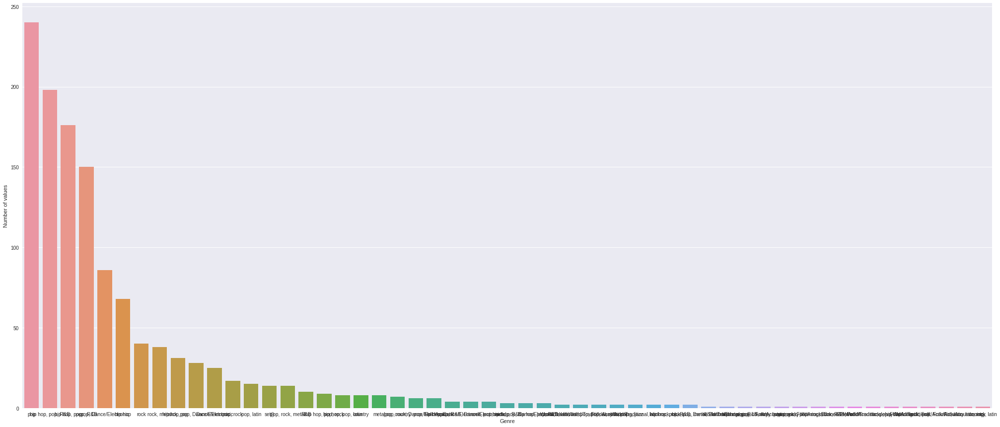

In [ ]:
values = df.genre.value_counts()
indexes = values.index

fig = plt.figure(figsize=(35, 15))
sns.barplot(indexes, values)

plt.ylabel('Number of values')
plt.xlabel('Genre')

Unique artists

In [ ]:
df.artist.value_counts()

Rihanna            21
Britney Spears     18
Eminem             18
Kanye West         16
Black Eyed Peas    14
                   ..
The Roots           1
Monica              1
Jaheim              1
Audioslave          1
Rita Ora            1
Name: artist, Length: 551, dtype: int64

Composition of the List

We will first look at what composes the top 50 songs.

[Text(0, 0.5, 'Artist'),
 Text(0.5, 0, 'Number of Songs'),
 Text(0.5, 1.0, 'Number of Songs per Artist')]

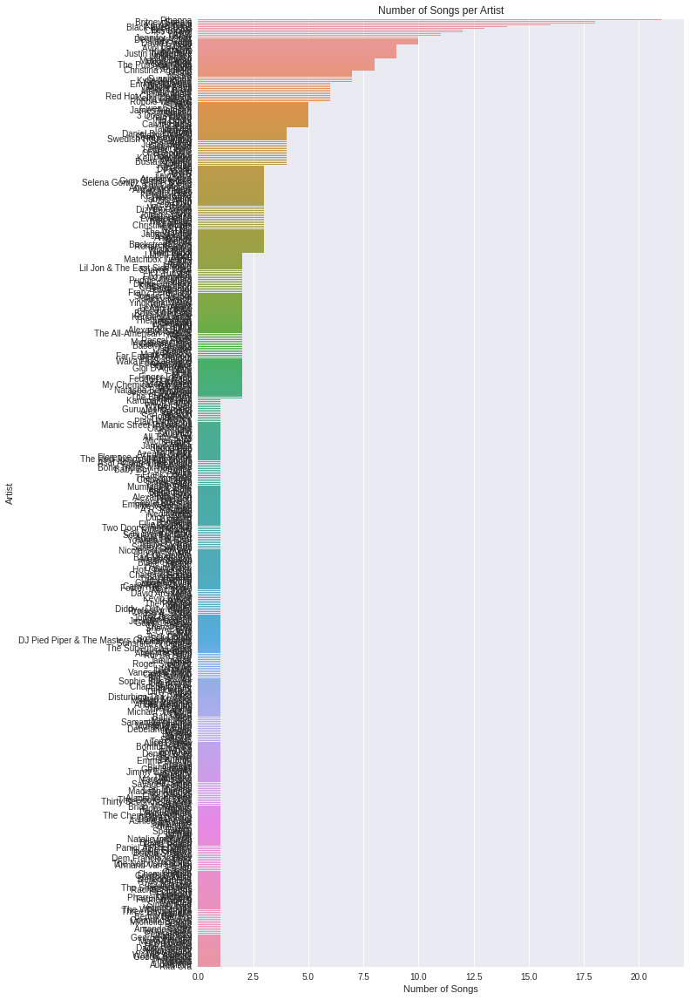

In [ ]:
plt.figure(figsize=(10,20))
sns.countplot(y='artist',data=df,order=df['artist'].value_counts().index).set(title='Number of Songs per Artist',
                                                                                       xlabel='Number of Songs',
                                                                                       ylabel='Artist')

[Text(0, 0.5, 'Genre'),
 Text(0.5, 0, 'Number of Songs'),
 Text(0.5, 1.0, 'Number of Songs per Genre')]

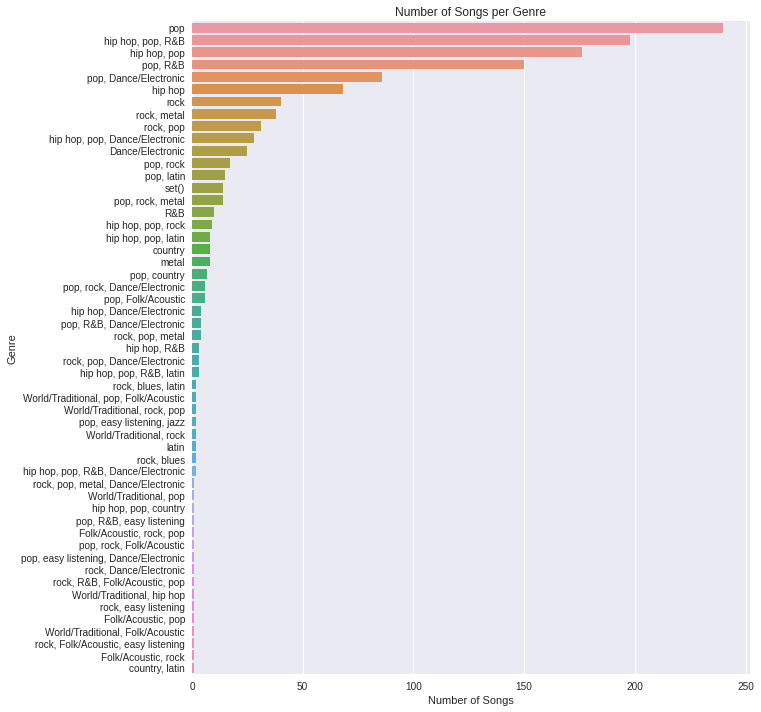

In [ ]:
plt.figure(figsize=(10,12))
sns.countplot(y='genre',data=df,order=df['genre'].value_counts().index).set(title='Number of Songs per Genre',
                                                                                       xlabel='Number of Songs',
                                                                                       ylabel='Genre')

Punto 6 (20 pts)
Compare los géneros Pop y Rock según sus características de: energy, valence y tempo.
Concluya sobre su análisis.

In [ ]:
pop = df [df['genre'] == 'pop']
rock = df [df['genre'] == 'rock']

In [ ]:
pop.head(10)

,artist,song,duration_ms,explicit,year,popularity,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,genre,count
0,Britney Spears,Oops!...I Did It Again,211160.0,0.0,2000.0,77.0,0.751,0.834,1.0,-5.444,0.0,0.0437,0.30000,0.000018,0.3550,0.894,95.053,pop,1.0
10,Gigi D'Agostino,L'Amour Toujours,238759.0,0.0,2011.0,1.0,0.617,0.728,7.0,-7.932,1.0,0.0292,0.03280,0.0482,0.3600,0.808,139.066,pop,1.0
11,Eiffel 65,Move Your Body - Gabry Ponte Original Radio Edit,268863.0,0.0,1999.0,56.0,0.745,0.958,7.0,-9.664,1.0,0.0287,0.08130,0.324,0.5330,0.960,129.962,pop,1.0
12,Bomfunk MC's,Freestyler,306333.0,0.0,2000.0,55.0,0.822,0.922,11.0,-5.798,0.0,0.0989,0.02910,0.325,0.2520,0.568,163.826,pop,1.0
16,Anastacia,I'm Outta Love - Radio Edit,245400.0,0.0,1999.0,64.0,0.761,0.716,10.0,-5.800,0.0,0.0560,0.39600,0.0,0.0771,0.649,119.410,pop,1.0
17,Alice Deejay,Better Off Alone,214883.0,0.0,2000.0,73.0,0.671,0.880,8.0,-6.149,0.0,0.0552,0.00181,0.691,0.2850,0.782,136.953,pop,1.0
18,Gigi D'Agostino,The Riddle,285426.0,0.0,1999.0,64.0,0.740,0.876,6.0,-6.870,0.0,0.0369,0.01730,0.00152,0.0785,0.825,127.002,pop,1.0
22,Sonique,It Feels So Good,240866.0,0.0,2000.0,62.0,0.634,0.677,5.0,-7.278,0.0,0.0304,0.01170,0.00103,0.1260,0.558,135.012,pop,1.0
32,Madonna,Music,225973.0,0.0,2000.0,58.0,0.736,0.802,7.0,-8.527,1.0,0.0663,0.00149,0.0876,0.1400,0.871,119.854,pop,1.0
34,Britney Spears,Born to Make You Happy,243533.0,0.0,1999.0,58.0,0.633,0.922,11.0,-4.842,0.0,0.0454,0.11600,0.000465,0.0710,0.686,84.110,pop,1.0


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



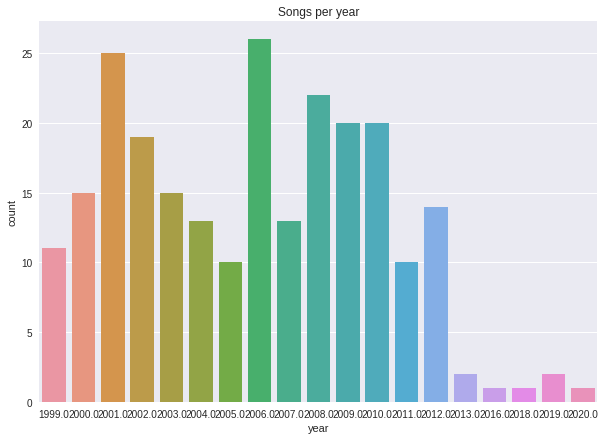

In [ ]:
plt.figure(figsize = (10, 7))
plt.title("Songs per year")
sns.countplot(pop['year']);

Text(0.5, 1.0, 'Energy Vs Loudness relationship')

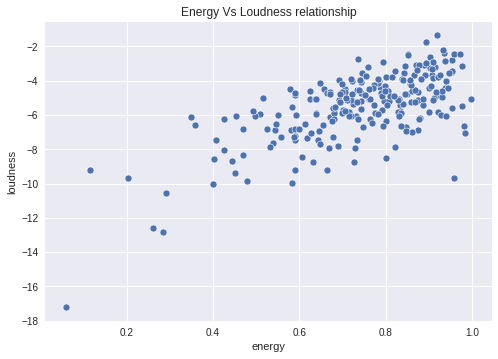

In [ ]:
sns.scatterplot(x= 'energy',y = 'loudness',data = pop)
plt.title("Energy Vs Loudness relationship")

Text(0.5, 1.0, 'valence Vs loudness relationship')

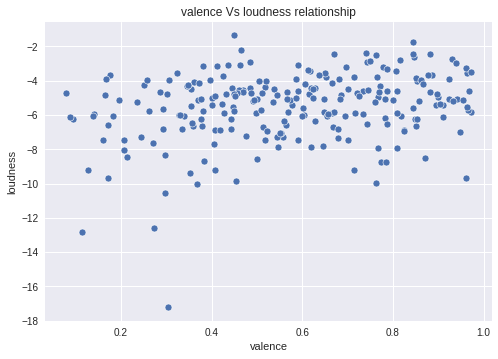

In [ ]:
sns.scatterplot(x= 'valence',y = 'loudness',data = pop)
plt.title("valence Vs loudness relationship")

Text(0.5, 1.0, 'Energy Vs acoustic relationship')

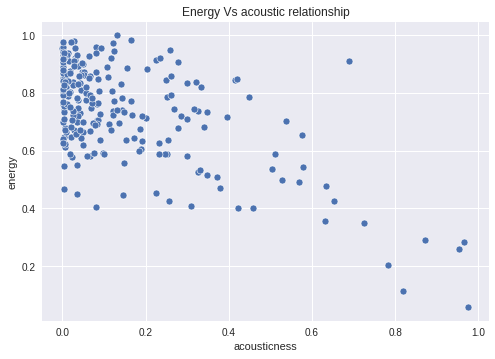

In [ ]:
sns.scatterplot(x= 'acousticness',y = 'energy',data = pop)
plt.title("Energy Vs acoustic relationship")

In [ ]:
df_popular_songs = pop.sort_values(by=['popularity'],ascending=False)
df_popular_songs[['song','year','artist']].head(10)

,song,year,artist
1227,Locked out of Heaven,2012.0,Bruno Mars
1238,Payphone,2012.0,Maroon 5
402,Toxic,2003.0,Britney Spears
1054,Baby,2010.0,Justin Bieber
930,Bad Romance,2009.0,Lady Gaga
1002,Bad Romance,2009.0,Lady Gaga
988,Party In The U.S.A.,2009.0,Miley Cyrus
691,How to Save a Life,2005.0,The Fray
702,Gimme More,2007.0,Britney Spears
1104,Grenade,2010.0,Bruno Mars


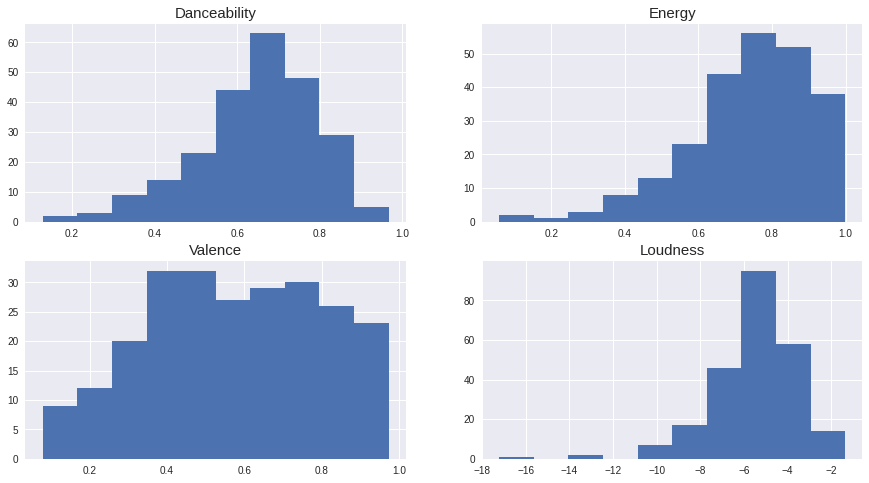

In [ ]:
fig,axes = plt.subplots(2,2,figsize=(15,8))

axes[0,0].hist(pop['danceability'])
axes[0,0].set_title('Danceability',fontsize=15)
axes[0,1].hist(pop['energy'])
axes[0,1].set_title('Energy',fontsize=15)
axes[1,0].hist(pop['valence'])
axes[1,0].set_title('Valence',fontsize=15)
axes[1,1].hist(pop['loudness'])
axes[1,1].set_title('Loudness',fontsize=15)
plt.show()

In [ ]:
top_artist = pop['artist'].value_counts().sort_values(ascending = False).reset_index()[:10]
top_artist

,index,artist
0,Britney Spears,18
1,P!nk,12
2,Lady Gaga,10
3,Katy Perry,9
4,Justin Timberlake,9
5,Avril Lavigne,9
6,Madonna,8
7,Christina Aguilera,8
8,Akon,8
9,Bruno Mars,6


In [ ]:
rock.head(10)

,artist,song,duration_ms,explicit,year,popularity,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,genre,count
66,Red Hot Chili Peppers,Otherside,255373.0,0.0,1999.0,78.0,0.458,0.795,0.0,-3.265,1.0,0.0574,0.003160,0.000202,0.0756,0.513,123.229,rock,1.0
193,OPM,Heaven Is a Halfpipe (If I Die),257426.0,1.0,2000.0,56.0,0.743,0.894,8.0,-6.886,1.0,0.0349,0.075500,0.00283,0.3670,0.770,95.900,rock,1.0
247,Red Hot Chili Peppers,Can't Stop,269000.0,0.0,2002.0,80.0,0.618,0.938,9.0,-3.442,1.0,0.0456,0.017900,0.0,0.1670,0.875,91.455,rock,1.0
280,Red Hot Chili Peppers,By the Way,216933.0,0.0,2002.0,73.0,0.451,0.970,0.0,-4.938,1.0,0.1070,0.026400,0.00355,0.1020,0.198,122.444,rock,1.0
363,Electric Six,Danger! High Voltage - Soulchild Radio Mix,214600.0,0.0,2003.0,0.0,0.660,0.698,11.0,-4.722,0.0,0.0302,0.000019,0.166,0.0517,0.511,123.005,rock,1.0
397,The Strokes,Reptilia,219826.0,0.0,2003.0,74.0,0.489,0.649,9.0,-5.110,1.0,0.0336,0.000603,0.713,0.1010,0.770,158.009,rock,1.0
427,Spiderbait,Black Betty - Edit,205973.0,0.0,2004.0,63.0,0.562,0.865,7.0,-6.476,0.0,0.0922,0.000021,0.591,0.2190,0.350,124.047,rock,1.0
461,Franz Ferdinand,Take Me Out,237026.0,0.0,2004.0,77.0,0.277,0.663,4.0,-8.821,0.0,0.0377,0.000409,0.00051,0.1360,0.527,104.561,rock,1.0
472,Green Day,American Idiot,176346.0,1.0,2004.0,77.0,0.380,0.988,1.0,-2.042,1.0,0.0639,0.000026,0.000079,0.3680,0.769,186.113,rock,1.0
506,Green Day,Boulevard of Broken Dreams,261266.0,1.0,2004.0,72.0,0.490,0.679,8.0,-3.680,1.0,0.0309,0.003940,0.000015,0.0383,0.506,167.046,rock,1.0


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



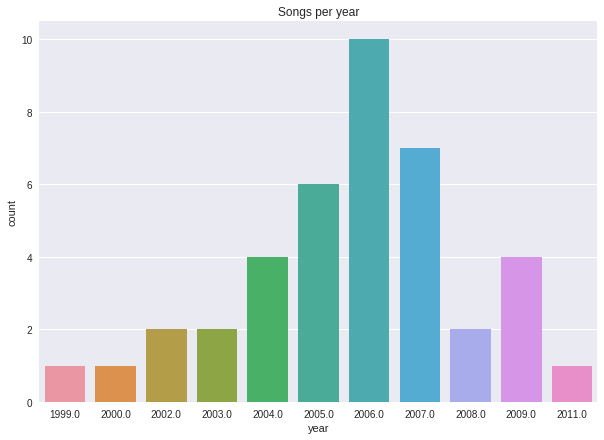

In [ ]:
plt.figure(figsize = (10, 7))
plt.title("Songs per year")
sns.countplot(rock['year']);

Text(0.5, 1.0, 'Energy Vs Loudness relationship')

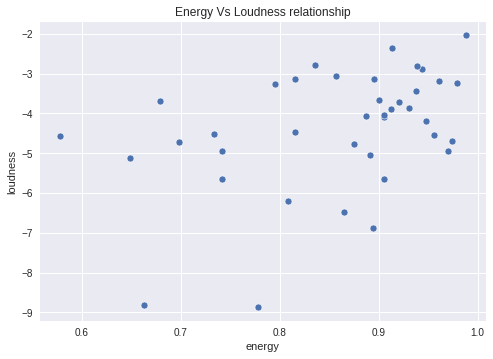

In [ ]:
sns.scatterplot(x= 'energy',y = 'loudness',data = rock)
plt.title("Energy Vs Loudness relationship")

Text(0.5, 1.0, 'valence Vs loudness relationship')

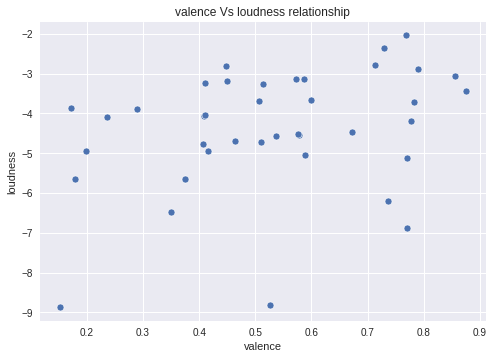

In [ ]:
sns.scatterplot(x= 'valence',y = 'loudness',data = rock)
plt.title("valence Vs loudness relationship")

Text(0.5, 1.0, 'acousticness Vs energy relationship')

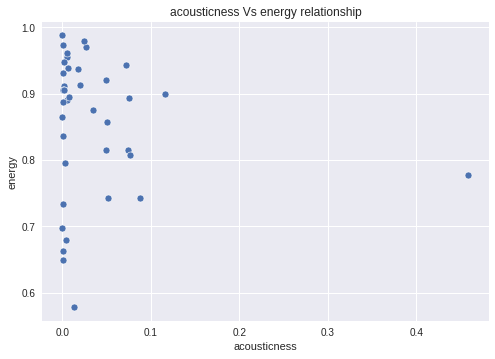

In [ ]:
sns.scatterplot(x= 'acousticness',y = 'energy',data = rock)
plt.title("acousticness Vs energy relationship")

Text(0.5, 1.0, 'tempo Vs energy relationship')

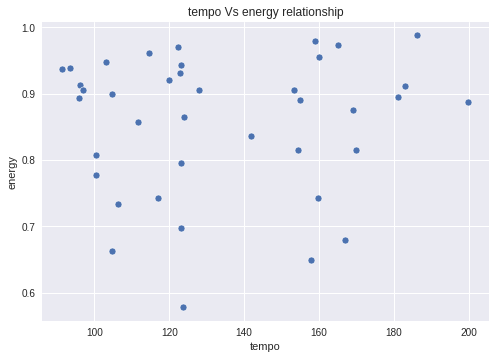

In [ ]:
sns.scatterplot(x= 'tempo',y = 'energy',data = rock)
plt.title("tempo Vs energy relationship")

In [ ]:
df_popular_songs = rock.sort_values(by=['popularity'],ascending=False)
df_popular_songs[['song','year','artist']].head(10)

,song,year,artist
744,Teenagers,2006.0,My Chemical Romance
985,Sex on Fire,2008.0,Kings of Leon
247,Can't Stop,2002.0,Red Hot Chili Peppers
882,Sex on Fire,2008.0,Kings of Leon
798,Snow (Hey Oh),2006.0,Red Hot Chili Peppers
66,Otherside,1999.0,Red Hot Chili Peppers
461,Take Me Out,2004.0,Franz Ferdinand
472,American Idiot,2004.0,Green Day
861,Kids,2007.0,MGMT
761,"Dear Maria, Count Me In",2007.0,All Time Low


In [ ]:
top_artist = rock['artist'].value_counts().sort_values(ascending = False).reset_index()[:10]
top_artist

,index,artist
0,Red Hot Chili Peppers,6
1,Arctic Monkeys,3
2,Kaiser Chiefs,3
3,Fall Out Boy,3
4,Green Day,3
5,Franz Ferdinand,2
6,My Chemical Romance,2
7,Kings of Leon,2
8,Muse,2
9,The Fratellis,1


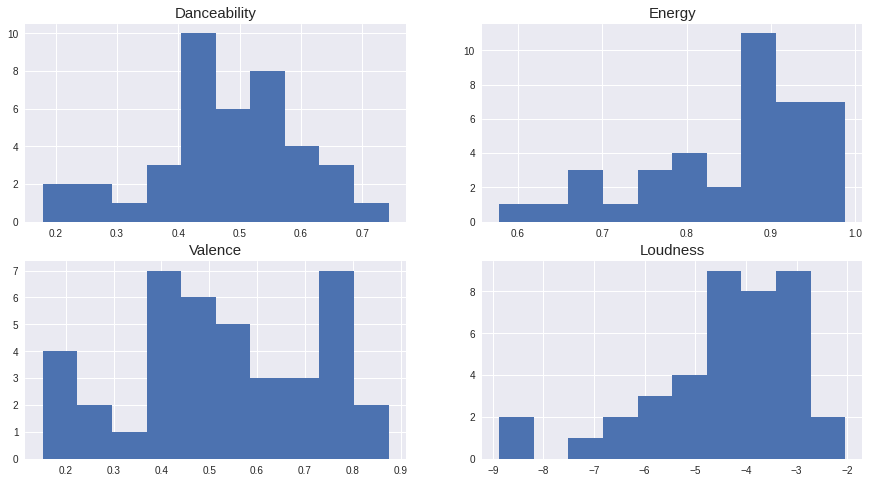

In [ ]:
fig,axes = plt.subplots(2,2,figsize=(15,8))

axes[0,0].hist(rock['danceability'])
axes[0,0].set_title('Danceability',fontsize=15)
axes[0,1].hist(rock['energy'])
axes[0,1].set_title('Energy',fontsize=15)
axes[1,0].hist(rock['valence'])
axes[1,0].set_title('Valence',fontsize=15)
axes[1,1].hist(rock['loudness'])
axes[1,1].set_title('Loudness',fontsize=15)
plt.show()

/usr/local/lib/python3.7/dist-packages/pandas/core/frame.py:3678: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



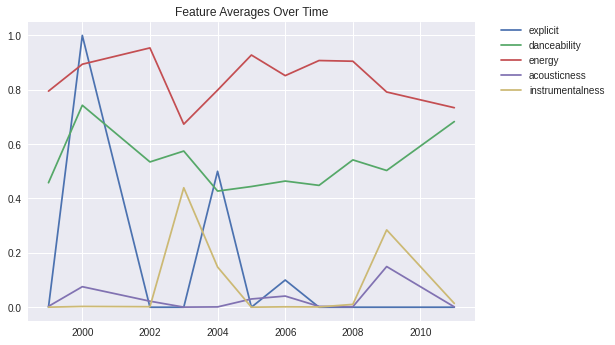

In [ ]:
# Lineplot of highly correlated features

from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()
rock[['loudness']] = scaler.fit_transform(rock[['loudness']])

highcorr_features = ['explicit', 'danceability', 'energy', 'acousticness', 'instrumentalness']
x = [i for i in range(1900, 2022)]
for feature in highcorr_features:
    y = [np.mean(rock[feature][rock.year == i]) for i in x]
    sns.lineplot(x=x, y=y, label=feature)

plt.title('Feature Averages Over Time')
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.show()

Punto 7 (15 pts)
Plantee una pregunta de negocio de su interés, ya sea por tipo de música, artistas u otra
dimensión, mediante la cual se analicen al menos 3 variables del dataset y concluya.

Se quiere conocer la distribución en terminos de energy,danceability,loudness,livenes,valence,popularity,acousticness,speechiness

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



[Text(0, 0.5, 'Number of Songs (Normalized)'),
 Text(0.5, 0, 'Energy'),
 Text(0.5, 1.0, 'Energy Distribution')]

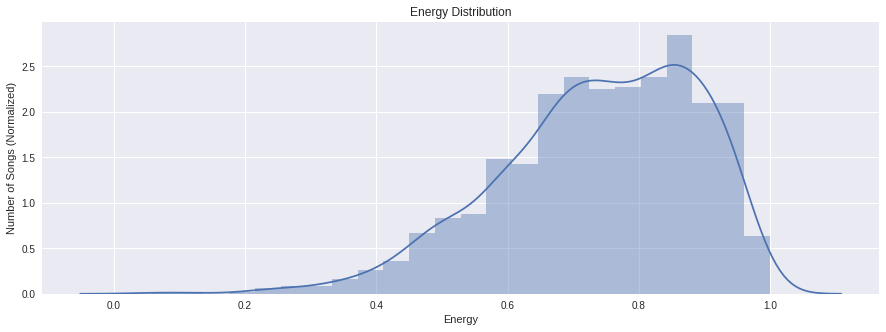

In [ ]:
plt.figure(figsize=(15,5))
sns.distplot(df['energy']).set(title='Energy Distribution',
                                        xlabel='Energy',
                                        ylabel='Number of Songs (Normalized)')

In [ ]:
print('Energy:')
print("Median:",df['energy'].median())
print("Standard Deviation:",df['energy'].std())
df['energy'].describe()

Energy:
Median: 0.752
Standard Deviation: 0.15149180410036286


count    1255.000000
mean        0.738948
std         0.151492
min         0.058100
25%         0.647000
50%         0.752000
75%         0.860500
max         0.999000
Name: energy, dtype: float64

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



[Text(0, 0.5, 'Number of Songs (Normalized)'),
 Text(0.5, 0, 'Danceability'),
 Text(0.5, 1.0, 'Danceability Distribution')]

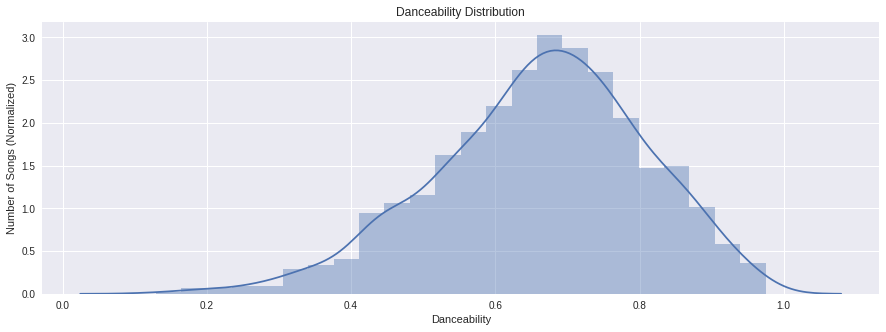

In [ ]:
plt.figure(figsize=(15,5))
sns.distplot(df['danceability']).set(title='Danceability Distribution',
                                        xlabel='Danceability',
                                        ylabel='Number of Songs (Normalized)')

In [ ]:
temp_param = 'danceability'
print(temp_param)
print("Median:",df[temp_param].median())
print("Standard Deviation:",df[temp_param].std())
df[temp_param].describe()

danceability
Median: 0.673
Standard Deviation: 0.14538062193098203


count    1255.000000
mean        0.661935
std         0.145381
min         0.129000
25%         0.570000
50%         0.673000
75%         0.762000
max         0.975000
Name: danceability, dtype: float64

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



[Text(0, 0.5, 'Number of Songs (Normalized)'),
 Text(0.5, 0, 'Loudness'),
 Text(0.5, 1.0, 'Loudness Distribution')]

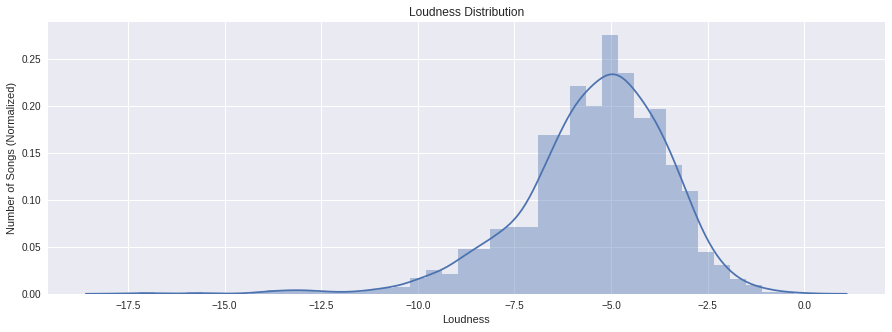

In [ ]:
plt.figure(figsize=(15,5))
sns.distplot(df['loudness']).set(title='Loudness Distribution',
                                        xlabel='Loudness',
                                        ylabel='Number of Songs (Normalized)')

In [ ]:
temp_param = 'loudness'
print(temp_param)
print("Median:",df[temp_param].median())
print("Standard Deviation:",df[temp_param].std())
df[temp_param].describe()

loudness
Median: -5.158
Standard Deviation: 1.9122378672730704


count    1255.000000
mean       -5.424407
std         1.912238
min       -17.217000
25%        -6.392500
50%        -5.158000
75%        -4.144500
max        -0.276000
Name: loudness, dtype: float64

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



[Text(0, 0.5, 'Number of Songs (Normalized)'),
 Text(0.5, 0, 'Liveness'),
 Text(0.5, 1.0, 'Liveness Distribution')]

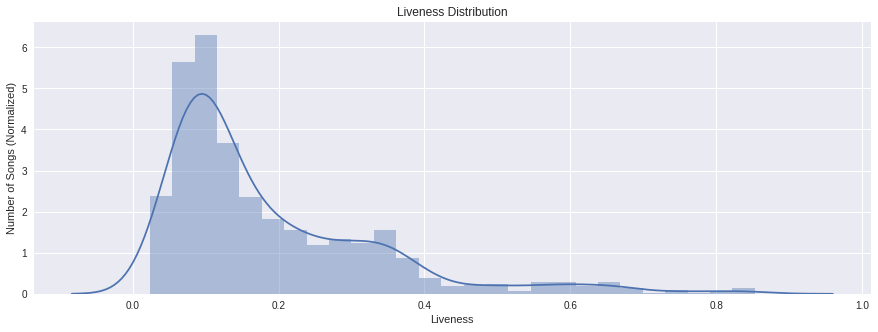

In [ ]:
plt.figure(figsize=(15,5))
sns.distplot(df['liveness']).set(title='Liveness Distribution',
                                        xlabel='Liveness',
                                        ylabel='Number of Songs (Normalized)')

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



[Text(0, 0.5, 'Number of Songs (Normalized)'),
 Text(0.5, 0, 'Valence'),
 Text(0.5, 1.0, 'Valence Distribution')]

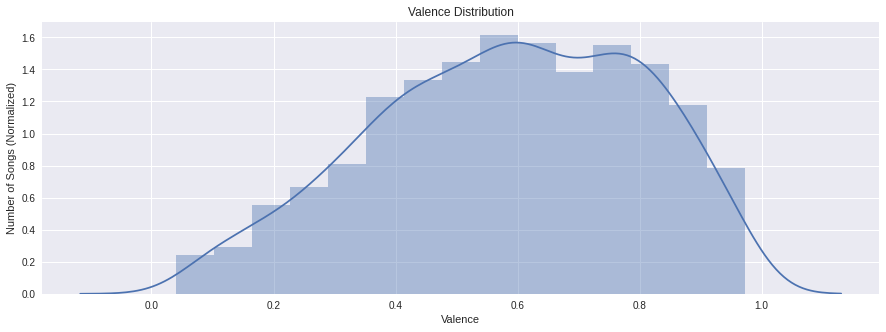

In [ ]:
plt.figure(figsize=(15,5))
sns.distplot(df['valence']).set(title='Valence Distribution',
                                        xlabel='Valence',
                                        ylabel='Number of Songs (Normalized)')

In [ ]:
temp_param = 'valence'
print(temp_param)
print("Median:",df[temp_param].median())
print("Standard Deviation:",df[temp_param].std())
df[temp_param].describe()

valence
Median: 0.594
Standard Deviation: 0.21849176812820761


count    1255.000000
mean        0.583161
std         0.218492
min         0.040600
25%         0.425500
50%         0.594000
75%         0.761500
max         0.973000
Name: valence, dtype: float64

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



[Text(0, 0.5, 'Number of Songs (Normalized)'),
 Text(0.5, 0, 'Acousticness'),
 Text(0.5, 1.0, 'Acousticness Distribution')]

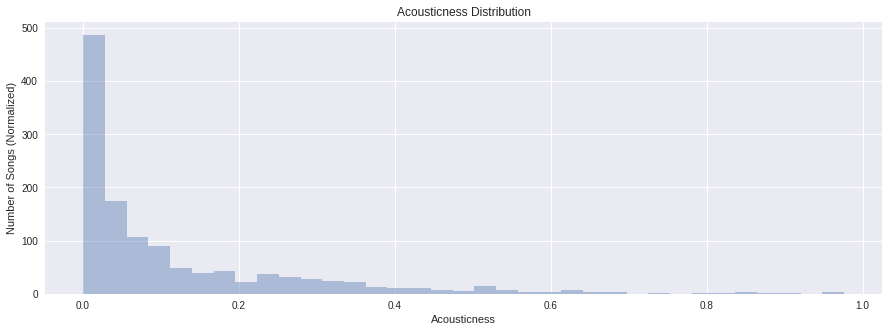

In [ ]:
plt.figure(figsize=(15,5))
sns.distplot(df['acousticness'],kde=False).set(title='Acousticness Distribution',
                                        xlabel='Acousticness',
                                        ylabel='Number of Songs (Normalized)')

In [ ]:
temp_param = 'acousticness'
print(temp_param)
print("Median:",df[temp_param].median())
print("Standard Deviation:",df[temp_param].std())
df[temp_param].describe()

acousticness
Median: 0.0505
Standard Deviation: 0.16120429204564363


count    1255.000000
mean        0.117934
std         0.161204
min         0.000019
25%         0.010750
50%         0.050500
75%         0.163500
max         0.976000
Name: acousticness, dtype: float64

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



[Text(0, 0.5, 'Number of Songs (Normalized)'),
 Text(0.5, 0, 'Speechiness'),
 Text(0.5, 1.0, 'Speechiness Distribution')]

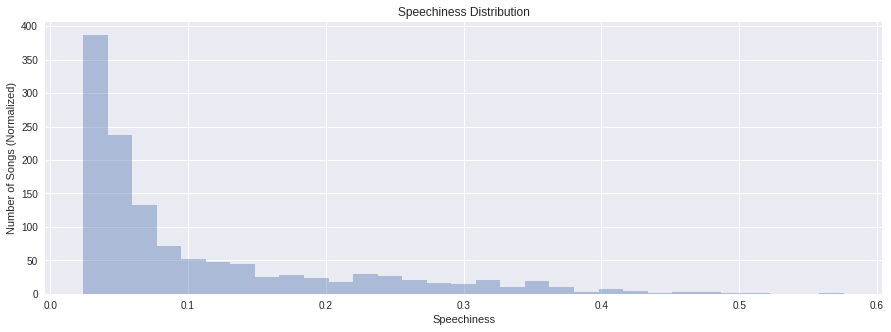

In [ ]:
plt.figure(figsize=(15,5))
sns.distplot(df['speechiness'],kde=False).set(title='Speechiness Distribution',
                                        xlabel='Speechiness',
                                        ylabel='Number of Songs (Normalized)')

In [ ]:
temp_param = 'speechiness'
print(temp_param)
print("Median:",df[temp_param].median())
print("Standard Deviation:",df[temp_param].std())
df[temp_param].describe()

speechiness
Median: 0.0598
Standard Deviation: 0.09847257244182396


count    1255.000000
mean        0.104875
std         0.098473
min         0.023900
25%         0.038150
50%         0.059800
75%         0.134500
max         0.576000
Name: speechiness, dtype: float64

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



[Text(0, 0.5, 'Number of Songs (Normalized)'),
 Text(0.5, 0, 'Popularity'),
 Text(0.5, 1.0, 'Popularity Distribution')]

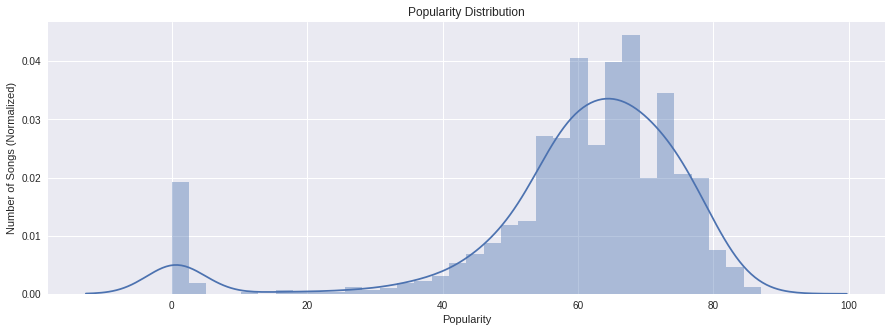

In [ ]:
plt.figure(figsize=(15,5))
sns.distplot(df['popularity']).set(title='Popularity Distribution',
                                        xlabel='Popularity',
                                        ylabel='Number of Songs (Normalized)')

In [ ]:
temp_param = 'popularity'
print(temp_param)
print("Median:",df[temp_param].median())
print("Standard Deviation:",df[temp_param].std())
df[temp_param].describe()

popularity
Median: 63.0
Standard Deviation: 17.622823397785996


count    1255.000000
mean       59.850996
std        17.622823
min         0.000000
25%        56.000000
50%        63.000000
75%        70.000000
max        87.000000
Name: popularity, dtype: float64

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



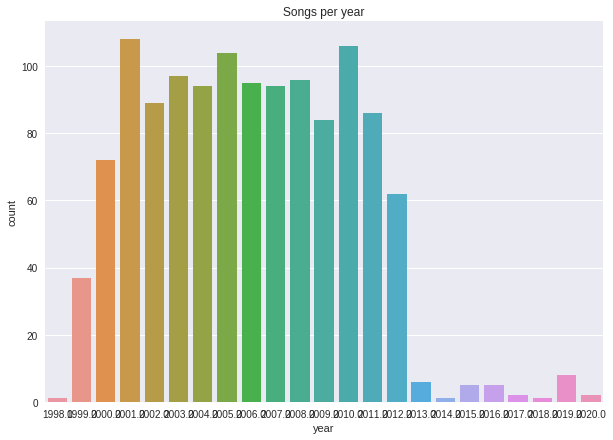

In [ ]:
plt.figure(figsize = (10, 7))
plt.title("Songs per year")
sns.countplot(df['year']);

Text(0.5, 1.0, 'Energy Vs Loudness relationship')

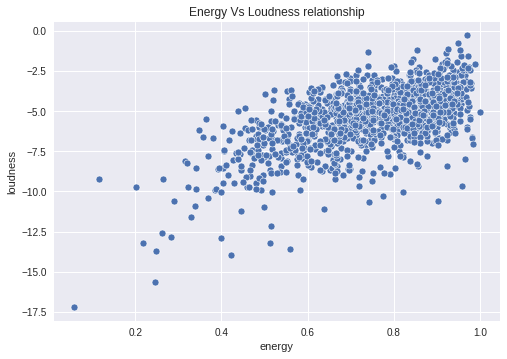

In [ ]:
sns.scatterplot(x= 'energy',y = 'loudness',data = df)
plt.title("Energy Vs Loudness relationship")

Text(0.5, 1.0, 'valence Vs loudness relationship')

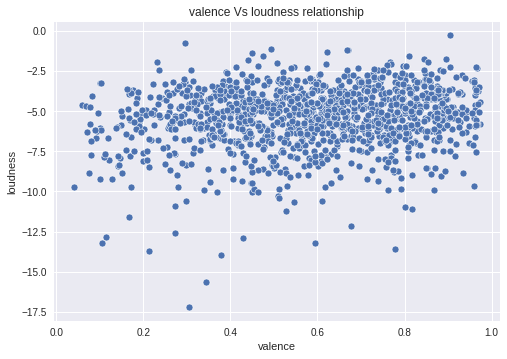

In [ ]:
sns.scatterplot(x= 'valence',y = 'loudness',data = df)
plt.title("valence Vs loudness relationship")

Text(0.5, 1.0, 'Energy Vs acoustic relationship')

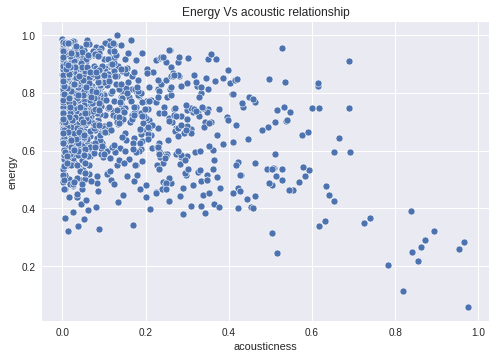

In [ ]:
sns.scatterplot(x= 'acousticness',y = 'energy',data = df)
plt.title("Energy Vs acoustic relationship")

Mapa de calor sobre las correlaciones entre las diversas variables

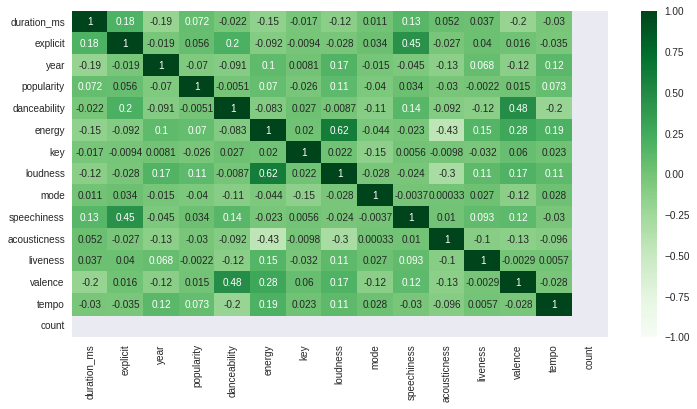

In [ ]:
plt.figure(figsize=(12, 6))
sns.heatmap(df.corr(), vmin=-1, vmax=1, annot=True, cmap="Greens")

Comportamiento de las canciones explicitas y no explicitas 
explicit and non-explicit songs through the years.
There has been a significant uptick in songs containing explicit lyrics with the rise of more liberal and experimental approaches to music as a form of expression. 

Text(0.5, 1.0, 'Bar plot of explicit vs. non-explicit songs on Spotify through the years.')

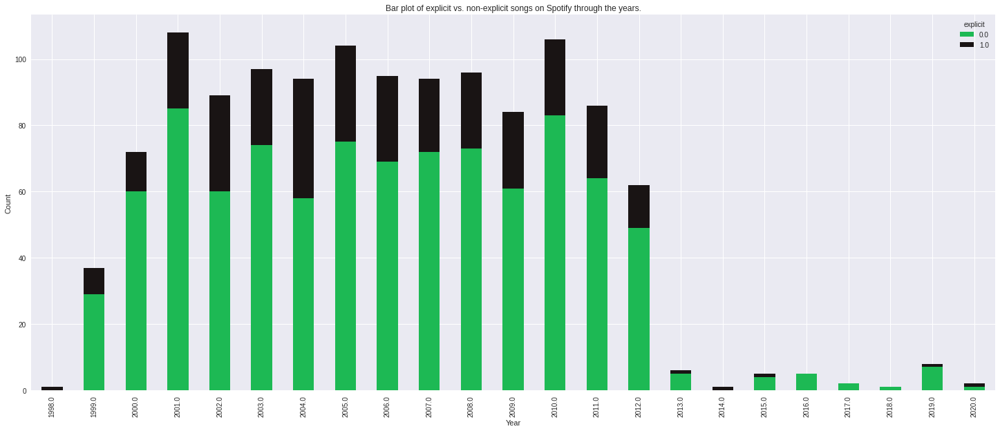

In [ ]:
df.groupby(["year", "explicit"]).size().unstack().plot(kind="bar", stacked="True", figsize=(25,10), color=["#1db954", "#191414"])
plt.xlabel("Year")
plt.ylabel("Count")
plt.title("Bar plot of explicit vs. non-explicit songs on Spotify through the years.")

In [ ]:
df.groupby("explicit").agg({"popularity": ["mean", "median", "std", len]})


popularity                       
               mean median        std  len
explicit                                  
0.0       59.273212   63.0  18.190118  937
1.0       61.553459   63.0  15.737254  318

In [ ]:
df5 = df[df['count']>100]
df5 = df5.sort_values(by=['popularity','count'],ascending=False)
df5[['artist','popularity']].head(50)

,artist,popularity


find the most frequent emotions emitted from Spotify tracks. From the given mode-key combination from each track, we can achieve this by making use of the principles of association rules

In [ ]:
emotions_df = df.groupby(["mode", "key"]).agg("mean")
emotions_df

duration_ms  explicit         year  popularity  danceability  \
mode key                                                                    
0.0  0.0   234676.075000  0.175000  2007.250000   61.600000      0.660075   
     1.0   233395.338983  0.288136  2005.711864   64.203390      0.695797   
     2.0   239331.000000  0.210526  2007.210526   60.736842      0.633526   
     3.0   232964.416667  0.125000  2005.541667   61.500000      0.660667   
     4.0   234589.280000  0.240000  2005.120000   59.820000      0.660240   
     5.0   239556.786667  0.200000  2006.120000   60.400000      0.677427   
     6.0   237349.777778  0.277778  2004.944444   60.351852      0.665889   
     7.0   223760.466667  0.200000  2006.333333   62.333333      0.679833   
     8.0   239843.075000  0.250000  2004.850000   61.275000      0.698075   
     9.0   244086.742857  0.314286  2006.171429   56.600000      0.698343   
     10.0  232417.846154  0.250000  2005.596154   59.653846      0.725154   
     11.0  234833.819277  0.240964  2007.084337   59.602410      0.670205   
1.0  0.0   233604.443038  0.240506  2005.860759   61.443038      0.637139   
     1.0   239361.963636  0.436364  2005.745455   57.909091      0.685645   
     2.0   247221.532468  0.207792  2005.948052   56.402597      0.627896   
     3.0   242054.818182  0.181818  2006.454545   66.681818      0.558364   
     4.0   222421.944444  0.111111  2005.944444   62.000000      0.607222   
     5.0   233993.552632  0.131579  2006.842105   58.815789      0.627263   
     6.0   237044.261905  0.190476  2004.714286   57.261905      0.683167   
     7.0   235623.130435  0.315217  2005.934783   59.782609      0.693880   
     8.0   232383.287879  0.303030  2005.439394   57.848485      0.676409   
     9.0   234072.607843  0.156863  2006.039216   63.000000      0.583882   
     10.0  234784.540541  0.189189  2005.972973   59.378378      0.560351   
     11.0  239634.727273  0.386364  2006.090909   56.045455      0.675932   

             energy  loudness  speechiness  acousticness  liveness   valence  \
mode key                                                                       
0.0  0.0   0.747125 -5.236850     0.081455      0.141963  0.171472  0.544872   
     1.0   0.733068 -5.431898     0.098405      0.105285  0.194912  0.580820   
     2.0   0.754526 -4.990526     0.071442      0.110667  0.184868  0.584274   
     3.0   0.784958 -4.878583     0.102563      0.121390  0.217750  0.649208   
     4.0   0.760040 -5.481300     0.111880      0.081607  0.191698  0.603100   
     5.0   0.736120 -5.403587     0.095949      0.162750  0.174331  0.599524   
     6.0   0.732111 -5.581296     0.118263      0.126831  0.194563  0.636500   
     7.0   0.731500 -6.013367     0.104727      0.080948  0.191917  0.591733   
     8.0   0.729700 -4.906725     0.119915      0.157967  0.158790  0.709400   
     9.0   0.712686 -5.970514     0.106966      0.143588  0.141237  0.565571   
     10.0  0.743904 -5.538327     0.129221      0.095874  0.178387  0.636762   
     11.0  0.781530 -4.979675     0.103647      0.088285  0.194869  0.629518   
1.0  0.0   0.737873 -5.609785     0.087537      0.143499  0.211119  0.565316   
     1.0   0.722018 -5.515418     0.151725      0.091123  0.174316  0.567175   
     2.0   0.760260 -5.044312     0.095849      0.091920  0.208101  0.544384   
     3.0   0.699459 -6.835727     0.092459      0.239319  0.181605  0.488936   
     4.0   0.721306 -5.445278     0.071647      0.185003  0.206283  0.509225   
     5.0   0.727263 -5.273263     0.067279      0.077438  0.237461  0.537816   
     6.0   0.708952 -5.896571     0.128817      0.128724  0.164414  0.588557   
     7.0   0.749043 -5.460185     0.112862      0.062922  0.200332  0.630709   
     8.0   0.723955 -5.452394     0.086886      0.124683  0.168680  0.569288   
     9.0   0.733333 -5.405608     0.089506      0.155606  0.148425  0.517824   
     10.0  0.702459 -5.625946     0.067722      0.194727  0.207868  0.464919   
     11.0 

In [ ]:
df.groupby("explicit").agg({"popularity": ["mean", "median", "std", len]})

popularity                       
               mean median        std  len
explicit                                  
0.0       59.273212   63.0  18.190118  937
1.0       61.553459   63.0  15.737254  318

In [ ]:
from scipy.stats import pearsonr
from scipy.stats import ttest_ind
import seaborn as sns
from sklearn.cluster import KMeans

In [ ]:
ttest_ind(df[df["explicit"] == 0]["popularity"], df[df["explicit"] == 1]["popularity"], equal_var=False)

Ttest_indResult(statistic=-2.1432403615912046, pvalue=0.032478540601811504)

In [ ]:
emotions_df = df.groupby(["mode", "key"]).agg("mean")
emotions_df

duration_ms  explicit         year  popularity  danceability  \
mode key                                                                    
0.0  0.0   234676.075000  0.175000  2007.250000   61.600000      0.660075   
     1.0   233395.338983  0.288136  2005.711864   64.203390      0.695797   
     2.0   239331.000000  0.210526  2007.210526   60.736842      0.633526   
     3.0   232964.416667  0.125000  2005.541667   61.500000      0.660667   
     4.0   234589.280000  0.240000  2005.120000   59.820000      0.660240   
     5.0   239556.786667  0.200000  2006.120000   60.400000      0.677427   
     6.0   237349.777778  0.277778  2004.944444   60.351852      0.665889   
     7.0   223760.466667  0.200000  2006.333333   62.333333      0.679833   
     8.0   239843.075000  0.250000  2004.850000   61.275000      0.698075   
     9.0   244086.742857  0.314286  2006.171429   56.600000      0.698343   
     10.0  232417.846154  0.250000  2005.596154   59.653846      0.725154   
     11.0  234833.819277  0.240964  2007.084337   59.602410      0.670205   
1.0  0.0   233604.443038  0.240506  2005.860759   61.443038      0.637139   
     1.0   239361.963636  0.436364  2005.745455   57.909091      0.685645   
     2.0   247221.532468  0.207792  2005.948052   56.402597      0.627896   
     3.0   242054.818182  0.181818  2006.454545   66.681818      0.558364   
     4.0   222421.944444  0.111111  2005.944444   62.000000      0.607222   
     5.0   233993.552632  0.131579  2006.842105   58.815789      0.627263   
     6.0   237044.261905  0.190476  2004.714286   57.261905      0.683167   
     7.0   235623.130435  0.315217  2005.934783   59.782609      0.693880   
     8.0   232383.287879  0.303030  2005.439394   57.848485      0.676409   
     9.0   234072.607843  0.156863  2006.039216   63.000000      0.583882   
     10.0  234784.540541  0.189189  2005.972973   59.378378      0.560351   
     11.0  239634.727273  0.386364  2006.090909   56.045455      0.675932   

             energy  loudness  speechiness  acousticness  liveness   valence  \
mode key                                                                       
0.0  0.0   0.747125 -5.236850     0.081455      0.141963  0.171472  0.544872   
     1.0   0.733068 -5.431898     0.098405      0.105285  0.194912  0.580820   
     2.0   0.754526 -4.990526     0.071442      0.110667  0.184868  0.584274   
     3.0   0.784958 -4.878583     0.102563      0.121390  0.217750  0.649208   
     4.0   0.760040 -5.481300     0.111880      0.081607  0.191698  0.603100   
     5.0   0.736120 -5.403587     0.095949      0.162750  0.174331  0.599524   
     6.0   0.732111 -5.581296     0.118263      0.126831  0.194563  0.636500   
     7.0   0.731500 -6.013367     0.104727      0.080948  0.191917  0.591733   
     8.0   0.729700 -4.906725     0.119915      0.157967  0.158790  0.709400   
     9.0   0.712686 -5.970514     0.106966      0.143588  0.141237  0.565571   
     10.0  0.743904 -5.538327     0.129221      0.095874  0.178387  0.636762   
     11.0  0.781530 -4.979675     0.103647      0.088285  0.194869  0.629518   
1.0  0.0   0.737873 -5.609785     0.087537      0.143499  0.211119  0.565316   
     1.0   0.722018 -5.515418     0.151725      0.091123  0.174316  0.567175   
     2.0   0.760260 -5.044312     0.095849      0.091920  0.208101  0.544384   
     3.0   0.699459 -6.835727     0.092459      0.239319  0.181605  0.488936   
     4.0   0.721306 -5.445278     0.071647      0.185003  0.206283  0.509225   
     5.0   0.727263 -5.273263     0.067279      0.077438  0.237461  0.537816   
     6.0   0.708952 -5.896571     0.128817      0.128724  0.164414  0.588557   
     7.0   0.749043 -5.460185     0.112862      0.062922  0.200332  0.630709   
     8.0   0.723955 -5.452394     0.086886      0.124683  0.168680  0.569288   
     9.0   0.733333 -5.405608     0.089506      0.155606  0.148425  0.517824   
     10.0  0.702459 -5.625946     0.067722      0.194727  0.207868  0.464919   
     11.0 

In [ ]:
confidences = []

for i in range(2): # Loop through each unique value for the mode variable
    mode_df = df.query("mode == @i") # Filter df to only contain tracks of the present mode
    for j in range (12): # Loop through each unique value for key variable
        modekey_df = mode_df.query("key == @j") # Filter df to only contain tracks of the present key, partnered with the present mode acquired in the parent loop
        confidences.append(len(modekey_df)/len(mode_df))

emotions_df.insert(loc=0, column="support", value=df.groupby(["mode", "key"]).size())
emotions_df.insert(loc=1, column="support_ratio", value=emotions_df["support"]/len(df))
emotions_df.insert(loc=2, column="confidence_modekey", value=confidences)
emotions_df

support  support_ratio  confidence_modekey    duration_ms  \
mode key                                                               
0.0  0.0        40       0.031873            0.071301  234676.075000   
     1.0        59       0.047012            0.105169  233395.338983   
     2.0        19       0.015139            0.033868  239331.000000   
     3.0        24       0.019124            0.042781  232964.416667   
     4.0        50       0.039841            0.089127  234589.280000   
     5.0        75       0.059761            0.133690  239556.786667   
     6.0        54       0.043028            0.096257  237349.777778   
     7.0        30       0.023904            0.053476  223760.466667   
     8.0        40       0.031873            0.071301  239843.075000   
     9.0        35       0.027888            0.062389  244086.742857   
     10.0       52       0.041434            0.092692  232417.846154   
     11.0       83       0.066135            0.147950  234833.819277   
1.0  0.0        79       0.062948            0.113833  233604.443038   
     1.0       110       0.087649            0.158501  239361.963636   
     2.0        77       0.061355            0.110951  247221.532468   
     3.0        22       0.017530            0.031700  242054.818182   
     4.0        36       0.028685            0.051873  222421.944444   
     5.0        38       0.030279            0.054755  233993.552632   
     6.0        42       0.033466            0.060519  237044.261905   
     7.0        92       0.073307            0.132565  235623.130435   
     8.0        66       0.052590            0.095101  232383.287879   
     9.0        51       0.040637            0.073487  234072.607843   
     10.0       37       0.029482            0.053314  234784.540541   
     11.0       44       0.035060            0.063401  239634.727273   

           explicit         year  popularity  danceability    energy  \
mode key                                                               
0.0  0.0   0.175000  2007.250000   61.600000      0.660075  0.747125   
     1.0   0.288136  2005.711864   64.203390      0.695797  0.733068   
     2.0   0.210526  2007.210526   60.736842      0.633526  0.754526   
     3.0   0.125000  2005.541667   61.500000      0.660667  0.784958   
     4.0   0.240000  2005.120000   59.820000      0.660240  0.760040   
     5.0   0.200000  2006.120000   60.400000      0.677427  0.736120   
     6.0   0.277778  2004.944444   60.351852      0.665889  0.732111   
     7.0   0.200000  2006.333333   62.333333      0.679833  0.731500   
     8.0   0.250000  2004.850000   61.275000      0.698075  0.729700   
     9.0   0.314286  2006.171429   56.600000      0.698343  0.712686   
     10.0  0.250000  2005.596154   59.653846      0.725154  0.743904   
     11.0  0.240964  2007.084337   59.602410      0.670205  0.781530   
1.0  0.0   0.240506  2005.860759   61.443038      0.637139  0.737873   
     1.0   0.436364  2005.745455   57.909091      0.685645  0.722018   
     2.0   0.207792  2005.948052   56.402597      0.627896  0.760260   
     3.0   0.181818  2006.454545   66.681818      0.558364  0.699459   
     4.0   0.111111  2005.944444   62.000000      0.607222  0.721306   
     5.0   0.131579  2006.842105   58.815789      0.627263  0.727263   
     6.0   0.190476  2004.714286   57.261905      0.683167  0.708952   
     7.0   0.315217  2005.934783   59.782609      0.693880  0.749043   
     8.0   0.303030  2005.439394   57.848485      0.676409  0.723955   
     9.0   0.156863  2006.039216   63.000000      0.583882  0.733333   
     10.0  0.189189  2005.972973   59.378378      0.560351  0.702459   
     11.0  0.386364  2006.090909   56.045455      0.675932  0.763455   

           loudness  speechiness  acousticness  liveness   valence  \
mode key                                                             
0.0  0.0  -5.236850     0.081455      0.141963  0.171472  0.544872   
     1.0  -5.431898     0.098405      0.105285  0.19491

In [ ]:
emotions = ["Innocently Sad, Love-Sick", "Despair, Wailing, Weeping", "Serious, Pious, Ruminating", "Deep Distress, Existential Angst", "Effeminate, Amorous, Restless", "Obscure, Plaintive, Funereal", "Gloomy, Passionate Resentment", "Discontent, Uneasiness", "Grumbling, Moaning, Wailing", "Tender, Plaintive, Pious", "Terrible, the Night, Mocking", "Solitary, Melancholic, Patience", "Innocently Happy", "Grief, Depressive", "Triumphant, Victorious War-Cries", "Cruel, Hard, Yet Full of Devotion", "Quarrelsome, Boisterous, Incomplete Pleasure", "Furious, Quick-Tempered, Passing Regret", "Conquering Difficulties, Sighs of Relief", "Serious, Magnificent, Fantasy", "Death, Eternity, Judgement", "Joyful, Pastoral, Declaration of Love", "Joyful, Quaint, Cheerful", "Harsh, Strong, Wild, Rage"]
emotions_df.insert(loc=3, column="emotion", value=emotions)
emotions_df = emotions_df.sort_values("support", ascending=False)
emotions_df

support  support_ratio  confidence_modekey  \
mode key                                                
1.0  1.0       110       0.087649            0.158501   
     7.0        92       0.073307            0.132565   
0.0  11.0       83       0.066135            0.147950   
1.0  0.0        79       0.062948            0.113833   
     2.0        77       0.061355            0.110951   
0.0  5.0        75       0.059761            0.133690   
1.0  8.0        66       0.052590            0.095101   
0.0  1.0        59       0.047012            0.105169   
     6.0        54       0.043028            0.096257   
     10.0       52       0.041434            0.092692   
1.0  9.0        51       0.040637            0.073487   
0.0  4.0        50       0.039841            0.089127   
1.0  11.0       44       0.035060            0.063401   
     6.0        42       0.033466            0.060519   
0.0  8.0        40       0.031873            0.071301   
     0.0        40       0.031873            0.071301   
1.0  5.0        38       0.030279            0.054755   
     10.0       37       0.029482            0.053314   
     4.0        36       0.028685            0.051873   
0.0  9.0        35       0.027888            0.062389   
     7.0        30       0.023904            0.053476   
     3.0        24       0.019124            0.042781   
1.0  3.0        22       0.017530            0.031700   
0.0  2.0        19       0.015139            0.033868   

                                                emotion    duration_ms  \
mode key                                                                 
1.0  1.0                              Grief, Depressive  239361.963636   
     7.0                  Serious, Magnificent, Fantasy  235623.130435   
0.0  11.0               Solitary, Melancholic, Patience  234833.819277   
1.0  0.0                               Innocently Happy  233604.443038   
     2.0               Triumphant, Victorious War-Cries  247221.532468   
0.0  5.0                   Obscure, Plaintive, Funereal  239556.786667   
1.0  8.0                     Death, Eternity, Judgement  232383.287879   
0.0  1.0                      Despair, Wailing, Weeping  233395.338983   
     6.0                  Gloomy, Passionate Resentment  237349.777778   
     10.0                  Terrible, the Night, Mocking  232417.846154   
1.0  9.0          Joyful, Pastoral, Declaration of Love  234072.607843   
0.0  4.0                  Effeminate, Amorous, Restless  234589.280000   
1.0  11.0                     Harsh, Strong, Wild, Rage  239634.727273   
     6.0       Conquering Difficulties, Sighs of Relief  237044.261905   
0.0  8.0                    Grumbling, Moaning, Wailing  239843.075000   
     0.0                      Innocently Sad, Love-Sick  234676.075000   
1.0  5.0        Furious, Quick-Tempered, Passing Regret  233993.552632   
     10.0                      Joyful, Quaint, Cheerful  234784.540541   
     4.0   Quarrelsome, Boisterous, Incomplete Pleasure  222421.944444   
0.0  9.0                       Tender, Plaintive, Pious  244086.742857   
     7.0                         Discontent, Uneasiness  223760.466667   
     3.0               Deep Distress, Existential Angst  232964.416667   
1.0  3.0              Cruel, Hard, Yet Full of Devotion  242054.818182   
0.0  2.0                     Serious, Pious, Ruminating  239331.000000   

           explicit         year  popularity  danceability    energy  \
mode key                                                               
1.0  1.0   0.436364  2005.745455   57.909091      0.685645  0.722018   
     7.0   0.315217  2005.934783   59.782609      0.693880  0.749043   
0.0  11.0  0.240964  2007.084337   59.602410      0.670205  0.781530   
1.0  0.0   0.240506  2005.860759   61.443038      0.637139  0.737873   
     2.0   0.207792  2005.948052   56.402597      0.627896  0.760260   
0.0  5.0   0.200000  2006.120000   60.400000      0.677427  0.736120   
1.0  8.0   0.303030  2005.4

In [ ]:
emotions_df.query("support_ratio >= 0.05 and confidence_modekey >= 0.10")

support  support_ratio  confidence_modekey  \
mode key                                                
1.0  1.0       110       0.087649            0.158501   
     7.0        92       0.073307            0.132565   
0.0  11.0       83       0.066135            0.147950   
1.0  0.0        79       0.062948            0.113833   
     2.0        77       0.061355            0.110951   
0.0  5.0        75       0.059761            0.133690   

                                    emotion    duration_ms  explicit  \
mode key                                                               
1.0  1.0                  Grief, Depressive  239361.963636  0.436364   
     7.0      Serious, Magnificent, Fantasy  235623.130435  0.315217   
0.0  11.0   Solitary, Melancholic, Patience  234833.819277  0.240964   
1.0  0.0                   Innocently Happy  233604.443038  0.240506   
     2.0   Triumphant, Victorious War-Cries  247221.532468  0.207792   
0.0  5.0       Obscure, Plaintive, Funereal  239556.786667  0.200000   

                  year  popularity  danceability    energy  loudness  \
mode key                                                               
1.0  1.0   2005.745455   57.909091      0.685645  0.722018 -5.515418   
     7.0   2005.934783   59.782609      0.693880  0.749043 -5.460185   
0.0  11.0  2007.084337   59.602410      0.670205  0.781530 -4.979675   
1.0  0.0   2005.860759   61.443038      0.637139  0.737873 -5.609785   
     2.0   2005.948052   56.402597      0.627896  0.760260 -5.044312   
0.0  5.0   2006.120000   60.400000      0.677427  0.736120 -5.403587   

           speechiness  acousticness  liveness   valence       tempo  count  
mode key                                                                     
1.0  1.0      0.151725      0.091123  0.174316  0.567175  118.431918    1.0  
     7.0      0.112862      0.062922  0.200332  0.630709  120.756696    1.0  
0.0  11.0     0.103647      0.088285  0.194869  0.629518  124.644108    1.0  
1.0  0.0      0.087537      0.143499  0.211119  0.565316  119.143582    1.0  
     2.0      0.095849      0.091920  0.208101  0.544384  123.703273    1.0  
0.0  5.0      0.095949      0.162750  0.174331  0.599524  118.662613    1.0

In [ ]:
df.query("mode == 1 and key == 0").sort_values("popularity", ascending=False).head(10) # Top 10 Major C songs

,artist,song,duration_ms,explicit,year,popularity,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,genre,count
1002,Lady Gaga,Bad Romance,294573.0,1.0,2009.0,80.0,0.696,0.921,0.0,-3.755,1.0,0.0363,0.00314,0.000052,0.0842,0.714,119.001,pop,1.0
930,Lady Gaga,Bad Romance,294573.0,1.0,2009.0,80.0,0.696,0.921,0.0,-3.755,1.0,0.0363,0.00314,0.000052,0.0842,0.714,119.001,pop,1.0
900,Black Eyed Peas,I Gotta Feeling,289133.0,0.0,2009.0,80.0,0.743,0.766,0.0,-6.375,1.0,0.0265,0.08730,0.0,0.5090,0.610,127.960,"hip hop, pop",1.0
1,blink-182,All The Small Things,167066.0,0.0,1999.0,79.0,0.434,0.897,0.0,-4.918,1.0,0.0488,0.01030,0.0,0.6120,0.684,148.726,"rock, pop",1.0
66,Red Hot Chili Peppers,Otherside,255373.0,0.0,1999.0,78.0,0.458,0.795,0.0,-3.265,1.0,0.0574,0.00316,0.000202,0.0756,0.513,123.229,rock,1.0
849,Estelle,American Boy,284733.0,1.0,2008.0,78.0,0.727,0.729,0.0,-2.990,1.0,0.3260,0.17100,0.0,0.0700,0.512,117.932,R&B,1.0
847,The Offspring,"You're Gonna Go Far, Kid",177826.0,1.0,2008.0,78.0,0.550,0.917,0.0,-3.159,1.0,0.0638,0.00428,0.0,0.1970,0.601,126.115,"rock, pop, metal",1.0
535,Eminem,Mockingbird,250760.0,1.0,2004.0,77.0,0.637,0.678,0.0,-3.798,1.0,0.2660,0.20900,0.0,0.1560,0.254,84.039,hip hop,1.0
1213,Flo Rida,Whistle,224653.0,0.0,2012.0,77.0,0.747,0.937,0.0,-5.746,1.0,0.0453,0.02080,0.0,0.2900,0.739,103.976,"hip hop, pop",1.0
1262,Snoop Dogg,Young Wild & Free (feat. Bruno Mars),207333.0,1.0,2011.0,77.0,0.715,0.655,0.0,-6.425,1.0,0.1370,0.05250,0.0,0.1150,0.531,95.078,"hip hop, pop",1.0


In [ ]:
df.query("mode == 1 and key == 7").sort_values("popularity", ascending=False).head(10) # Top 10 Major G songs

,artist,song,duration_ms,explicit,year,popularity,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,genre,count
201,Eminem,Without Me,290320.0,1.0,2002.0,87.0,0.908,0.669,7.0,-2.827,1.0,0.0738,0.002860,0.0,0.2370,0.662,112.238,hip hop,1.0
1244,Calvin Harris,Feel So Close - Radio Edit,206413.0,0.0,2012.0,79.0,0.707,0.924,7.0,-2.842,1.0,0.0310,0.000972,0.00703,0.2040,0.919,127.937,"hip hop, pop, Dance/Electronic",1.0
1201,Carly Rae Jepsen,Call Me Maybe,193400.0,0.0,2012.0,78.0,0.783,0.580,7.0,-6.548,1.0,0.0408,0.011400,0.000002,0.1080,0.660,120.021,"pop, Dance/Electronic",1.0
503,Rihanna,Pon de Replay,246960.0,0.0,2005.0,77.0,0.779,0.640,7.0,-8.415,1.0,0.1590,0.000155,0.00077,0.1010,0.498,99.019,"hip hop, pop, R&B",1.0
942,Soulja Boy,Kiss Me Thru The Phone,193386.0,1.0,2008.0,76.0,0.758,0.712,7.0,-3.781,1.0,0.1120,0.018500,0.0,0.0677,0.795,149.998,"hip hop, pop",1.0
476,Kanye West,Through The Wire,221226.0,1.0,2004.0,76.0,0.571,0.739,7.0,-6.110,1.0,0.2470,0.008650,0.000005,0.1580,0.660,83.089,hip hop,1.0
703,Fergie,Big Girls Don't Cry (Personal),268120.0,0.0,2006.0,76.0,0.708,0.641,7.0,-4.296,1.0,0.0335,0.205000,0.0,0.0945,0.253,113.082,"pop, R&B",1.0
1193,P!nk,Raise Your Glass,202960.0,1.0,2010.0,76.0,0.700,0.709,7.0,-5.006,1.0,0.0838,0.004800,0.0,0.0290,0.624,122.019,pop,1.0
621,Muse,Supermassive Black Hole,212439.0,0.0,2006.0,75.0,0.668,0.921,7.0,-3.727,1.0,0.0439,0.049200,0.00517,0.0877,0.782,120.000,rock,1.0
747,Avril Lavigne,Girlfriend,216600.0,1.0,2007.0,75.0,0.560,0.959,7.0,-2.433,1.0,0.1020,0.000722,0.000221,0.2090,0.669,163.983,pop,1.0


In [ ]:
df.query("mode == 1 and key == 2").sort_values("popularity", ascending=False).head(10) # Top 10 Major D songs

,artist,song,duration_ms,explicit,year,popularity,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,genre,count
400,Usher,Yeah! (feat. Lil Jon & Ludacris),250373.0,0.0,2004.0,81.0,0.894,0.791,2.0,-4.699,1.0,0.1120,0.018300,0.0,0.0388,0.5830,105.018,"hip hop, pop, R&B",1.0
702,Britney Spears,Gimme More,251240.0,0.0,2007.0,79.0,0.788,0.844,2.0,-3.131,1.0,0.0334,0.250000,0.000678,0.0723,0.3820,113.324,pop,1.0
107,Jimmy Eat World,The Middle,165853.0,0.0,2001.0,78.0,0.643,0.849,2.0,-5.428,1.0,0.0526,0.037100,0.0,0.0580,0.9030,162.152,"rock, pop",1.0
705,Plain White T's,Hey There Delilah,232533.0,0.0,2005.0,78.0,0.656,0.291,2.0,-10.572,1.0,0.0293,0.872000,0.0,0.1140,0.2980,103.971,pop,1.0
302,Eminem,"Lose Yourself - From ""8 Mile"" Soundtrack",322226.0,1.0,2004.0,77.0,0.686,0.735,2.0,-4.616,1.0,0.2640,0.009210,0.00066,0.3420,0.0596,171.355,hip hop,1.0
1260,P!nk,Try,247906.0,0.0,2012.0,76.0,0.674,0.628,2.0,-7.079,1.0,0.0300,0.001440,0.0,0.0944,0.5520,103.998,pop,1.0
527,JAY-Z,Numb / Encore,205733.0,1.0,2004.0,76.0,0.687,0.793,2.0,-4.254,1.0,0.1660,0.060300,0.0,0.5820,0.7510,107.045,hip hop,1.0
129,Daft Punk,One More Time,320357.0,0.0,2001.0,76.0,0.613,0.697,2.0,-8.618,1.0,0.1330,0.019400,0.0,0.3320,0.4760,122.746,"hip hop, Dance/Electronic",1.0
761,All Time Low,"Dear Maria, Count Me In",182826.0,0.0,2007.0,76.0,0.459,0.895,2.0,-3.126,1.0,0.0805,0.007250,0.0,0.2060,0.5720,181.040,rock,1.0
693,My Chemical Romance,Welcome to the Black Parade,311106.0,0.0,2006.0,76.0,0.217,0.905,2.0,-4.103,1.0,0.0752,0.000289,0.00011,0.2220,0.2360,96.950,rock,1.0
